## A.1: Shoot the Pictures

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import json

In [2]:
np.set_printoptions(suppress=True, precision=4, linewidth=200)

In [3]:

%%html
<style>
.output_scroll {
    height: auto !important;
    max-height: none !important;
}
</style>

In [4]:
def load_and_display(image_paths, title="Image Set", max_width=800):
    images = []
    for path in image_paths:
        img = Image.open(path)
        from PIL import ImageOps
        img = ImageOps.exif_transpose(img)
        
        # Resize image
        if img.width > max_width:
            ratio = max_width / img.width
            new_size = (max_width, int(img.height * ratio))
            
            img = img.resize(new_size, Image.Resampling.LANCZOS)
            
            base_name = os.path.splitext(path)[0]
            save_path = f"{base_name}.jpg"
            
            img.save(save_path, quality=98, subsampling=0)
            
        images.append(np.array(img))
    
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
    
    if n == 1:
        axes = [axes]
    
    for i, (ax, img) in enumerate(zip(axes, images)):
        ax.imshow(img)
        ax.set_title(f'img {i+1}', fontsize=12)
        ax.axis('off')
    
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return images

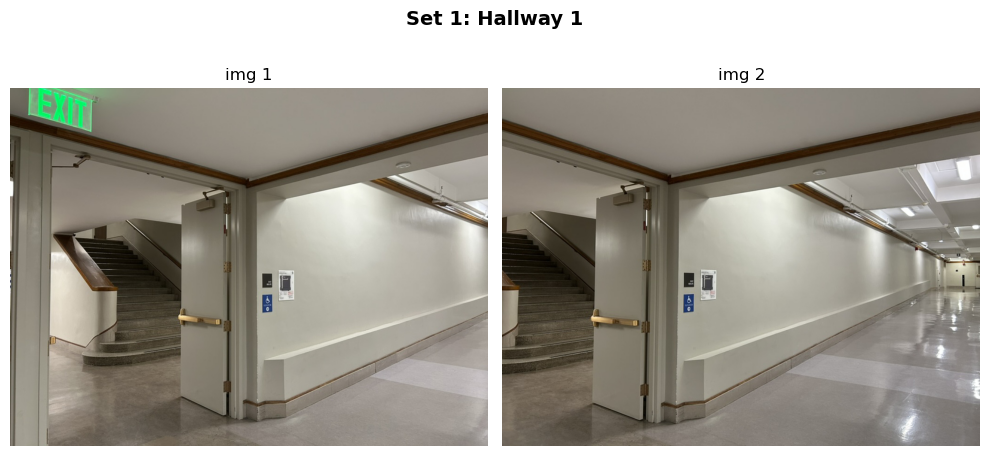

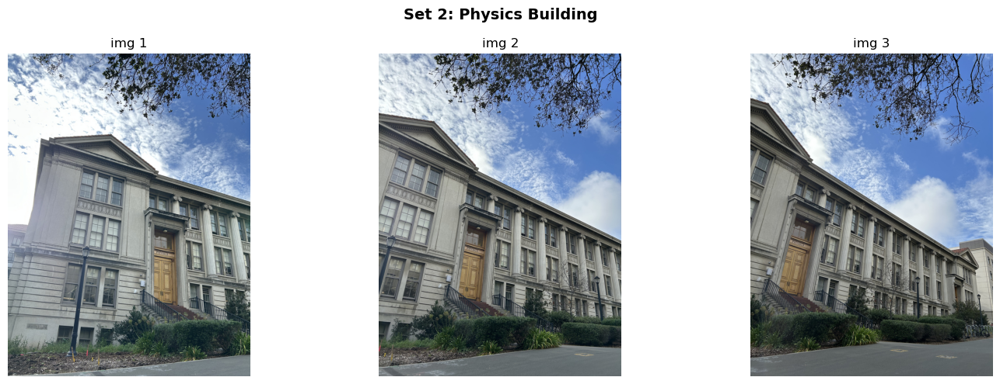

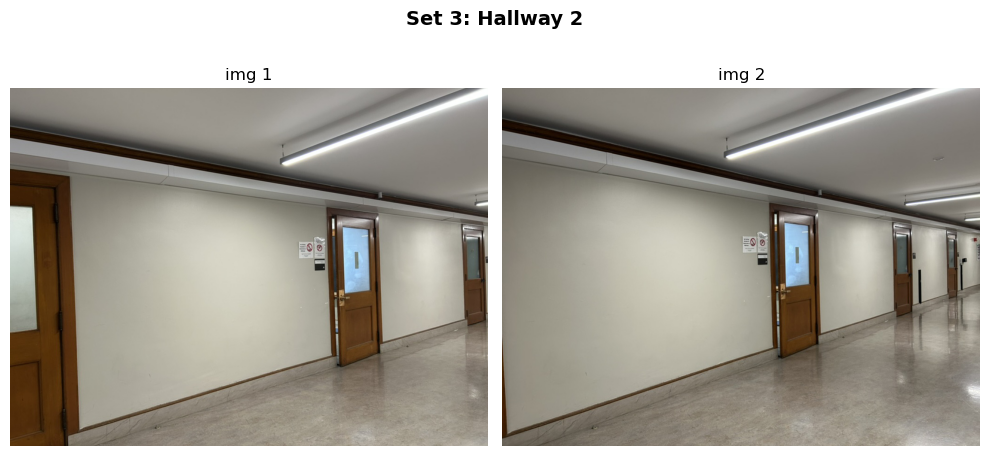

In [5]:
MAX_WIDTH = 800

# Set 1: Hallway1 (2) 
b1p_imgs = load_and_display([
    'b1.jpg',
    'b2.jpg'
], title="Set 1: Hallway 1", max_width=MAX_WIDTH)


# Set 2: Physics Building (3) 
phy_imgs = load_and_display([
    'phy1.jpg',
    'phy2.jpg',
    'phy3.jpg'
], title="Set 2: Physics Building", max_width=MAX_WIDTH)

# Set 3: Hallway2 (2)
a1p_imgs = load_and_display([
    'a1.jpg',
    'a2.jpg'
], title="Set 3: Hallway 2", max_width=MAX_WIDTH)

## A.2: Recover Homographies

In [6]:
def load_points(json_path):
    with open(json_path, 'r') as f:
        data = json.load(f)
    pts1 = np.array(data['im1Points'])
    pts2 = np.array(data['im2Points'])
    return pts1, pts2

def visualize_correspondences(img1, img2, pts1, pts2, title="Correspondences"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
    
    ax1.imshow(img1)
    ax1.set_title("Image 1")
    ax1.axis('off')
    ax1.plot(pts1[:, 0], pts1[:, 1], 'r+', markersize=12, markeredgewidth=2)
    for i, (x, y) in enumerate(pts1):
        ax1.text(x, y, str(i+1), color='yellow', fontsize=11, fontweight='bold')
    
    ax2.imshow(img2)
    ax2.set_title("Image 2")
    ax2.axis('off')
    ax2.plot(pts2[:, 0], pts2[:, 1], 'r+', markersize=12, markeredgewidth=2)
    for i, (x, y) in enumerate(pts2):
        ax2.text(x, y, str(i+1), color='yellow', fontsize=11, fontweight='bold')
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    save_name = title.replace(" ", "_").replace(":", "").replace("<->", "").lower() + "_correspondences.jpg"
    plt.savefig(save_name, dpi=150, bbox_inches='tight')
    plt.show()

def computeH(im1_pts, im2_pts):
    n = im1_pts.shape[0]
    A = []
    for i in range(n):
        x, y = im1_pts[i]
        xp, yp = im2_pts[i]
        A.append([-x, -y, -1,  0,  0,  0, x*xp, y*xp, xp])
        A.append([ 0,  0,  0, -x, -y, -1, x*yp, y*yp, yp])
    A = np.array(A)

    print("\n" + "="*60)
    print("System of Equations: Ah = 0")
    print("="*60)
    print(f"Matrix A shape: {A.shape}")
    print(f"\nFirst 4 rows (from first 2 point pairs):")
    print(A[:4])
    print("="*60 + "\n")
    
    U, S, Vt = np.linalg.svd(A)
    h = Vt[-1, :]
    H = h.reshape(3, 3)
    return H / H[2, 2]



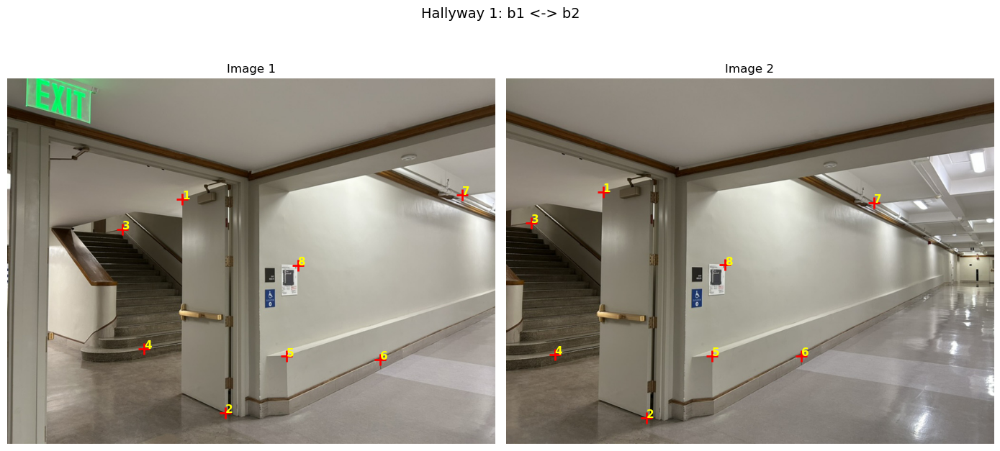


System of Equations: Ah = 0
Matrix A shape: (16, 9)

First 4 rows (from first 2 point pairs):
[[  -287   -198     -1      0      0      0  45633  31482    159]
 [     0      0      0   -287   -198     -1  53382  36828    186]
 [  -357   -549     -1      0      0      0  82110 126270    230]
 [     0      0      0   -357   -549     -1 198849 305793    557]]

H (b1 -> b2):
[[   1.3504   -0.0256 -203.6383]
 [   0.1492    1.1958  -69.9777]
 [   0.0004   -0.        1.    ]]


In [7]:
# Hallway1: b1 <-> b2
pts1, pts2 = load_points('b1_b2.json')
visualize_correspondences(b1p_imgs[0], b1p_imgs[1], pts1, pts2, "Hallyway 1: b1 <-> b2")
D12 = computeH(pts1, pts2)
print("H (b1 -> b2):")
print(D12)



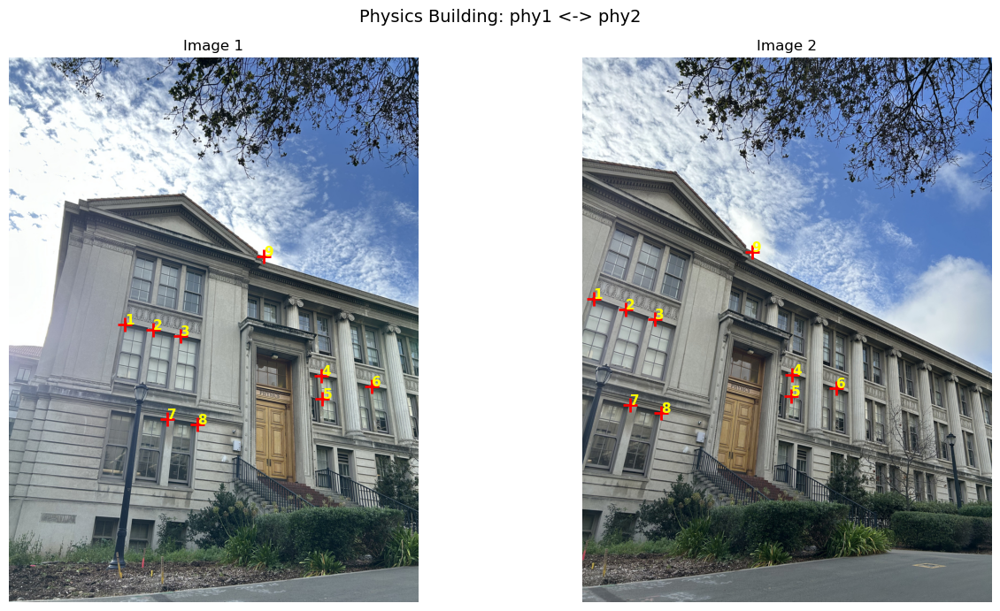


System of Equations: Ah = 0
Matrix A shape: (18, 9)

First 4 rows (from first 2 point pairs):
[[  -227   -521     -1      0      0      0   4767  10941     21]
 [     0      0      0   -227   -521     -1 107144 245912    472]
 [  -282   -533     -1      0      0      0  23688  44772     84]
 [     0      0      0   -282   -533     -1 139026 262769    493]]

H (phy1 -> phy2):
[[   1.2777   -0.1484 -189.8984]
 [   0.3379    1.144  -166.1635]
 [   0.0004   -0.        1.    ]]


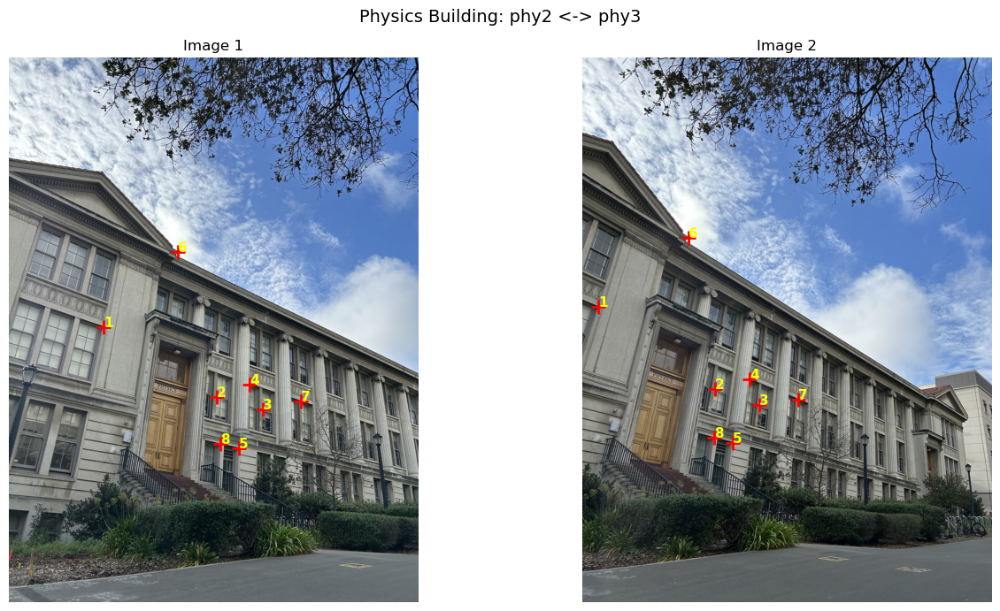


System of Equations: Ah = 0
Matrix A shape: (16, 9)

First 4 rows (from first 2 point pairs):
[[  -185   -527     -1      0      0      0   5735  16337     31]
 [     0      0      0   -185   -527     -1  90095 256649    487]
 [  -406   -663     -1      0      0      0 105154 171717    259]
 [     0      0      0   -406   -663     -1 263494 430287    649]]


H (phy2 -> phy3):
[[   1.222    -0.1077 -136.943 ]
 [   0.2608    1.126  -129.53  ]
 [   0.0003   -0.        1.    ]]


In [8]:
# Physics Building: phy1 <-> phy2
pts5, pts6 = load_points('phy1_phy2.json')
visualize_correspondences(phy_imgs[0], phy_imgs[1], pts5, pts6, "Physics Building: phy1 <-> phy2")
P12 = computeH(pts5, pts6)
print("H (phy1 -> phy2):")
print(P12)

# phy2 <-> phy3
pts7, pts8 = load_points('phy2_phy3.json')
visualize_correspondences(phy_imgs[1], phy_imgs[2], pts7, pts8, "Physics Building: phy2 <-> phy3")
P23 = computeH(pts7, pts8)
print("\nH (phy2 -> phy3):")
print(P23)

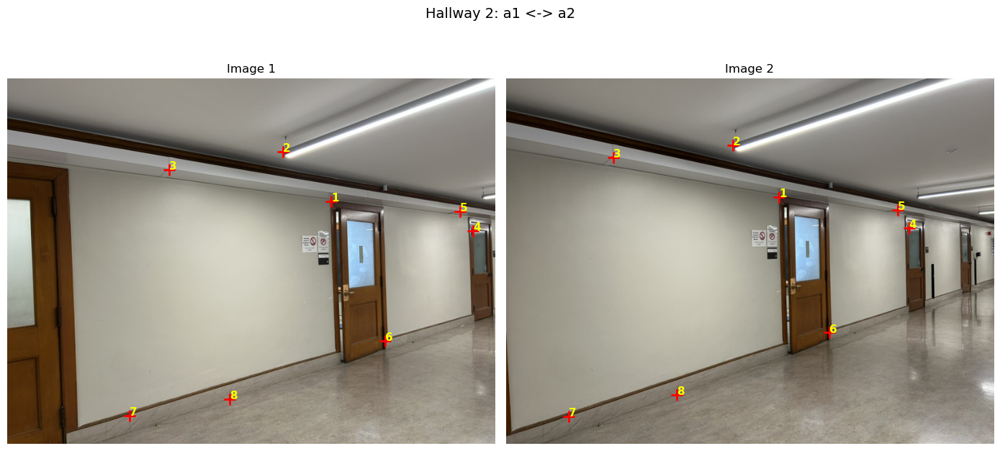


System of Equations: Ah = 0
Matrix A shape: (16, 9)

First 4 rows (from first 2 point pairs):
[[  -531   -202     -1      0      0      0 237888  90496    448]
 [     0      0      0   -531   -202     -1 103014  39188    194]
 [  -452   -120     -1      0      0      0 168144  44640    372]
 [     0      0      0   -452   -120     -1  49268  13080    109]]

H (a1 -> a2):
[[   1.224     0.0008 -135.4527]
 [   0.0895    1.1371  -54.9722]
 [   0.0003    0.        1.    ]]


In [9]:

# Hallway 2: a1 <-> a2
pts9, pts10 = load_points('a1_a2.json')
visualize_correspondences(a1p_imgs[0], a1p_imgs[1], pts9, pts10, "Hallway 2: a1 <-> a2")
SH12 = computeH(pts9, pts10)
print("H (a1 -> a2):")
print(SH12)



## A.3: Warp the Images

In [10]:
def compute_bounds(im_shape, H):
    
    h, w = im_shape[:2]
    
   
    corners = np.array([
        [0, 0, 1],      #top left
        [w-1, 0, 1],    #top right
        [w-1, h-1, 1],  #bottom right
        [0, h-1, 1]     #bottom left
    ]).T
    
    
    warped_corners = H @ corners
    warped_corners = warped_corners[:2] / warped_corners[2]
    
    
    x_min, y_min = np.floor(warped_corners.min(axis=1)).astype(int)
    x_max, y_max = np.ceil(warped_corners.max(axis=1)).astype(int)
    
    return x_min, y_min, x_max, y_max


In [11]:
def warpImageNearestNeighbor(im, H):
    
    h, w = im.shape[:2]
    
    
    x_min, y_min, x_max, y_max = compute_bounds(im.shape, H)
    out_h = y_max - y_min + 1
    out_w = x_max - x_min + 1
    
    
    warped = np.zeros((out_h, out_w, 4), dtype=np.uint8)
    
    
    H_inv = np.linalg.inv(H)
    
   
    for y_out in range(out_h):
        for x_out in range(out_w):
            x = x_out + x_min
            y = y_out + y_min
            
            
            point = np.array([x, y, 1])
            src_point = H_inv @ point
            src_x = src_point[0] / src_point[2]
            src_y = src_point[1] / src_point[2] #normalize
            
            
            src_x_int = int(round(src_x))
            src_y_int = int(round(src_y))
            
           
            if 0 <= src_x_int < w and 0 <= src_y_int < h:
                warped[y_out, x_out, :3] = im[src_y_int, src_x_int]  # RGB
                warped[y_out, x_out, 3] = 255 
    
    return warped, (x_min, y_min)


In [12]:
def warpImageBilinear(im, H):
    h, w = im.shape[:2]
    
    x_min, y_min, x_max, y_max = compute_bounds(im.shape, H)
    out_h = y_max - y_min + 1
    out_w = x_max - x_min + 1
    
    
    n_channels = im.shape[2] if len(im.shape) == 3 else 1
    
    warped = np.zeros((out_h, out_w, n_channels), dtype=np.float64)
    
    H_inv = np.linalg.inv(H)
    
    for y_out in range(out_h):
        for x_out in range(out_w):
            x = x_out + x_min
            y = y_out + y_min
            
            point = np.array([x, y, 1])
            src_point = H_inv @ point
            src_x = src_point[0] / src_point[2]
            src_y = src_point[1] / src_point[2]
            
            x0 = int(np.floor(src_x))
            x1 = x0 + 1
            y0 = int(np.floor(src_y))
            y1 = y0 + 1
            
            if 0 <= x0 < w and x1 < w and 0 <= y0 < h and y1 < h:
                wx = src_x - x0
                wy = src_y - y0
                
                
                for c in range(n_channels):
                    warped[y_out, x_out, c] = (
                        (1-wx) * (1-wy) * im[y0, x0, c] +
                        wx * (1-wy) * im[y0, x1, c] +
                        (1-wx) * wy * im[y1, x0, c] +
                        wx * wy * im[y1, x1, c]
                    )
    
    return warped.astype(np.uint8), (x_min, y_min)

In [13]:
def rectification(img, json_path, title="Rectification"):
    
    with open(json_path, 'r') as f:
        data = json.load(f)
    src_pts = np.array(data['im1Points'])
    dst_pts = np.array(data['im2Points'])
    
    H_rect = computeH(src_pts, dst_pts)
    print(f"\nHomography matrix:")
    print(H_rect)
    print(f"{'='*60}\n")
    
    warped_nn, offset_nn = warpImageNearestNeighbor(img, H_rect)
    warped_bl, offset_bl = warpImageBilinear(img, H_rect)
    
    
    warped_nn_display = crop_to_target_rectangle(warped_nn, dst_pts, offset_nn)
    warped_bl_display = crop_to_target_rectangle(warped_bl, dst_pts, offset_bl)
    
    print(f"Full warped size: {warped_nn.shape}")
    print(f"Cropped for display: {warped_nn_display.shape}")
    
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    axes[0].imshow(img)
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(warped_nn_display)
    axes[1].set_title("Nearest Neighbor")
    axes[1].axis('off')
    
    axes[2].imshow(warped_bl_display)
    axes[2].set_title("Bilinear Interpolation")
    axes[2].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()
    
    
    return warped_nn_display, warped_bl_display, H_rect

In [14]:
def crop_to_target_rectangle(warped_img, dst_pts, offset):
    
    x_min, y_min = offset
    
    rect_x_min = int(dst_pts[:, 0].min() - x_min)
    rect_x_max = int(dst_pts[:, 0].max() - x_min)
    rect_y_min = int(dst_pts[:, 1].min() - y_min)
    rect_y_max = int(dst_pts[:, 1].max() - y_min)
    
    
    rect_x_min = max(0, rect_x_min)
    rect_x_max = min(warped_img.shape[1], rect_x_max)
    rect_y_min = max(0, rect_y_min)
    rect_y_max = min(warped_img.shape[0], rect_y_max)
    
    
    cropped = warped_img[rect_y_min:rect_y_max, rect_x_min:rect_x_max]
    
    return cropped

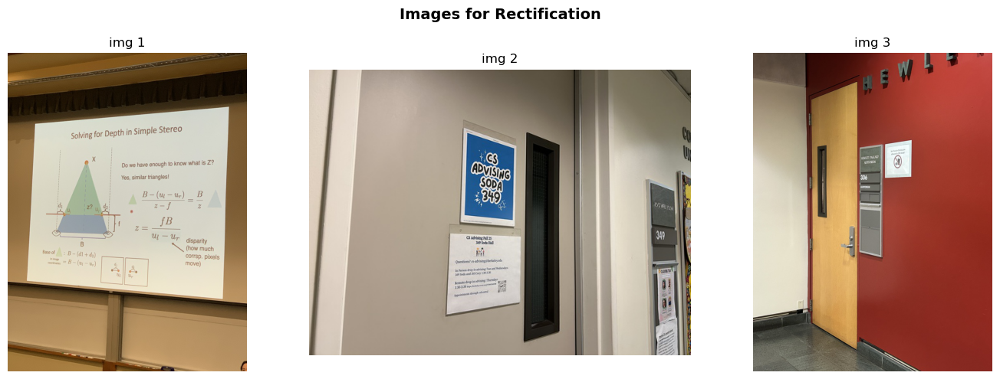


Loaded images:
  Screen: (800, 600, 3)
  Blue: (450, 600, 3)
  Door: (800, 600, 3)

System of Equations: Ah = 0
Matrix A shape: (8, 9)

First 4 rows (from first 2 point pairs):
[[   -69   -179     -1      0      0      0      0      0      0]
 [     0      0      0    -69   -179     -1      0      0      0]
 [  -555   -136     -1      0      0      0 444000 108800    800]
 [     0      0      0   -555   -136     -1      0      0      0]]


Homography matrix:
[[   2.1132    0.1022 -164.0945]
 [   0.1433    1.6199 -299.8607]
 [   0.0005    0.0001    1.    ]]

Full warped size: (1253, 1052, 4)
Cropped for display: (600, 800, 4)


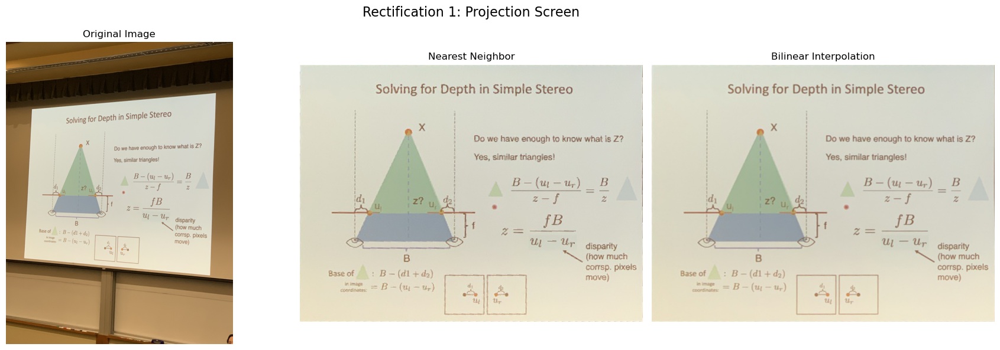


System of Equations: Ah = 0
Matrix A shape: (8, 9)

First 4 rows (from first 2 point pairs):
[[ -244   -92    -1     0     0     0     0     0     0]
 [    0     0     0  -244   -92    -1     0     0     0]
 [ -326  -122    -1     0     0     0 27058 10126    83]
 [    0     0     0  -326  -122    -1     0     0     0]]


Homography matrix:
[[   0.5782    0.0194 -142.8676]
 [  -0.2331    0.6371   -1.7405]
 [  -0.0013    0.        1.    ]]

Full warped size: (1274, 1083, 4)
Cropped for display: (138, 83, 4)


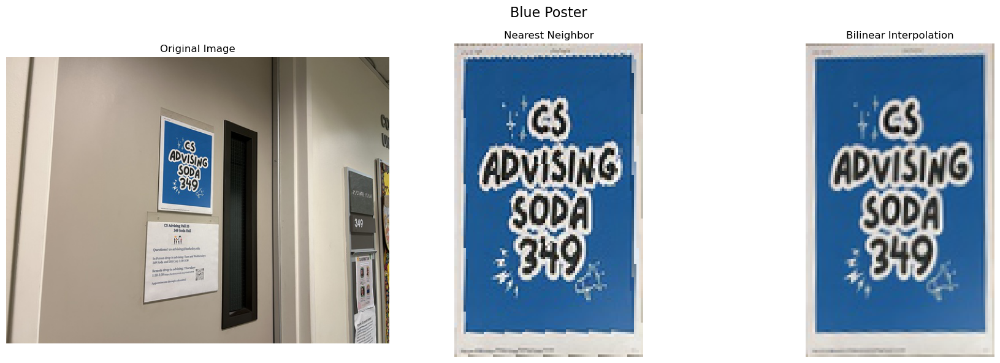


System of Equations: Ah = 0
Matrix A shape: (8, 9)

First 4 rows (from first 2 point pairs):
[[ -146  -118    -1     0     0     0     0     0     0]
 [    0     0     0  -146  -118    -1     0     0     0]
 [ -261   -73    -1     0     0     0 30537  8541   117]
 [    0     0     0  -261   -73    -1     0     0     0]]


Homography matrix:
[[   1.6348   -0.0088 -237.6456]
 [   0.5702    1.4571 -255.1875]
 [   0.0024   -0.0001    1.    ]]

Full warped size: (1239, 580, 4)
Cropped for display: (634, 117, 4)


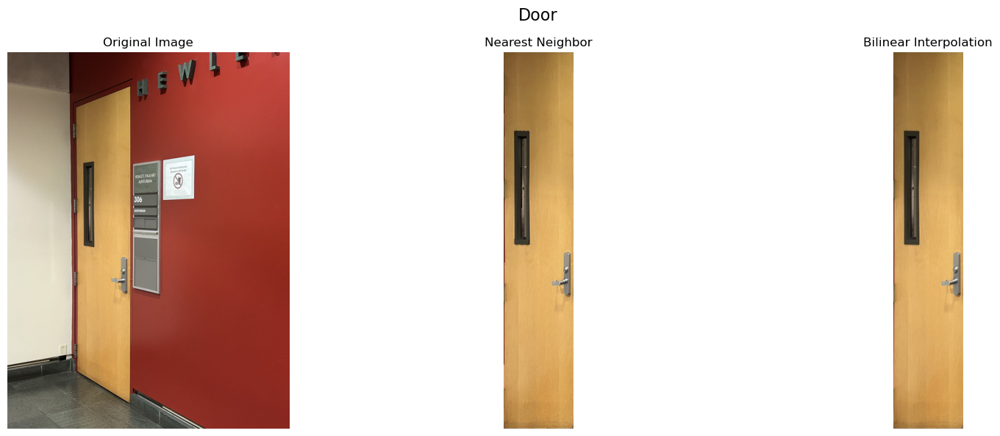

In [15]:

images = load_and_display(
    ['screen.jpg', 'blue.jpg', 'door.jpg'],
    title="Images for Rectification",
    max_width=600
)

screen = images[0]
blue = images[1]
door = images[2]


print(f"\nLoaded images:")
print(f"  Screen: {screen.shape}")
print(f"  Blue: {blue.shape}")
print(f"  Door: {door.shape}")


warped_nn1, warped_bl1, H1 = rectification(
    screen,
    'screen_screen.json',
    "Rectification 1: Projection Screen"
)
plt.imsave('screen_nn.jpg', warped_nn1)
plt.imsave('screen_bilinear.jpg', warped_bl1)



warped_nn2, warped_bl2, H2 = rectification(blue, 'blue_blue.json', "Blue Poster")
plt.imsave('blue_nn.jpg', warped_nn2)
plt.imsave('blue_bilinear.jpg', warped_bl2)

warped_nn3, warped_bl3, H3 = rectification(door, 'door_door.json', "Door")
plt.imsave('door_nn.jpg', warped_nn3)
plt.imsave('door_bilinear.jpg', warped_bl3)


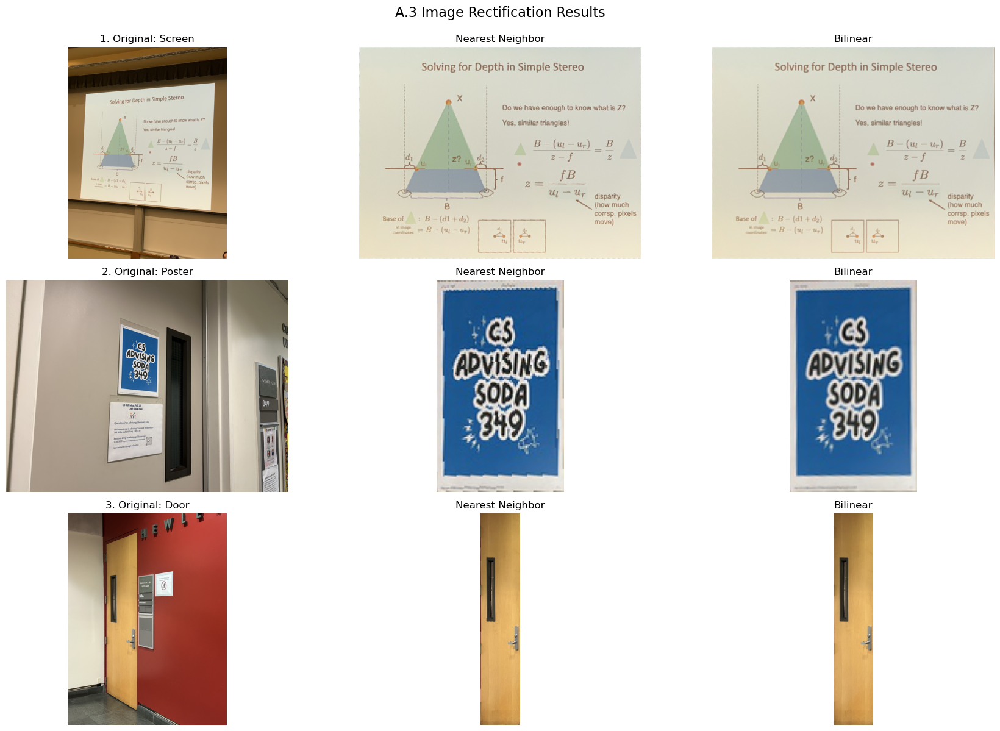

In [16]:
fig = plt.figure(figsize=(18, 12))

ax1 = plt.subplot(3, 3, 1)
ax1.imshow(screen)
ax1.set_title("1. Original: Screen")
ax1.axis('off')

ax2 = plt.subplot(3, 3, 2)
ax2.imshow(warped_nn1)
ax2.set_title("Nearest Neighbor")
ax2.axis('off')

ax3 = plt.subplot(3, 3, 3)
ax3.imshow(warped_bl1)
ax3.set_title("Bilinear")
ax3.axis('off')

ax4 = plt.subplot(3, 3, 4)
ax4.imshow(blue)
ax4.set_title("2. Original: Poster")
ax4.axis('off')

ax5 = plt.subplot(3, 3, 5)
ax5.imshow(warped_nn2)
ax5.set_title("Nearest Neighbor")
ax5.axis('off')

ax6 = plt.subplot(3, 3, 6)
ax6.imshow(warped_bl2)
ax6.set_title("Bilinear")
ax6.axis('off')

ax7 = plt.subplot(3, 3, 7)
ax7.imshow(door)
ax7.set_title("3. Original: Door")
ax7.axis('off')

ax8 = plt.subplot(3, 3, 8)
ax8.imshow(warped_nn3)
ax8.set_title("Nearest Neighbor")
ax8.axis('off')

ax9 = plt.subplot(3, 3, 9)
ax9.imshow(warped_bl3)
ax9.set_title("Bilinear")
ax9.axis('off')

plt.suptitle("A.3 Image Rectification Results", fontsize=16, y=0.995)
plt.tight_layout()

plt.savefig('rectification_all_results.jpg', dpi=150, bbox_inches='tight')

plt.show()

## A.4: Blend the Images into a Mosaic

In [17]:
def create_mosaic_canvas(images_with_offsets):
    
    x_min, y_min = 0, 0
    x_max, y_max = 0, 0
    
    for img, (x_off, y_off) in images_with_offsets:
        h, w = img.shape[:2]
        x_min = min(x_min, x_off)
        y_min = min(y_min, y_off)
        x_max = max(x_max, x_off + w)
        y_max = max(y_max, y_off + h)
    
    canvas_h = y_max - y_min
    canvas_w = x_max - x_min
    
    return (canvas_h, canvas_w, 4), (x_min, y_min)


In [18]:
def create_alpha_mask(h, w, feather_width=None):
    # Create alpha mask on original image - center=1, linearly decays to 0 at edges
    if feather_width is None:
        feather_width = min(h, w) // 4
    
    alpha = np.ones((h, w), dtype=np.float64)
    
    for i in range(h):
        for j in range(w):
            dist_to_edge = min(i, j, h-1-i, w-1-j)
            if dist_to_edge < feather_width:
                alpha[i, j] = dist_to_edge / feather_width
    
    return alpha

In [19]:
def linear_blend(images_with_offsets):
    # Weighted average blending
    canvas_shape, (x_min, y_min) = create_mosaic_canvas(images_with_offsets)
    
    canvas = np.zeros(canvas_shape, dtype=np.float64)
    weight_sum = np.zeros(canvas_shape[:2], dtype=np.float64)
    
    for img_rgba, (x_off, y_off) in images_with_offsets:
        h, w = img_rgba.shape[:2]
        weight = img_rgba[:, :, 3] / 255.0
        
        y_start = y_off - y_min
        x_start = x_off - x_min
        y_end = y_start + h
        x_end = x_start + w
        
        for c in range(3):
            canvas[y_start:y_end, x_start:x_end, c] += img_rgba[:, :, c] * weight
        
        weight_sum[y_start:y_end, x_start:x_end] += weight
    
    weight_sum[weight_sum == 0] = 1
    for c in range(3):
        canvas[:, :, c] /= weight_sum
    
    canvas[:, :, 3] = (weight_sum > 0) * 255
    
    return canvas.astype(np.uint8)


In [20]:
def compute_transforms_to_reference(correspondences, reference_idx):
    n_images = len(correspondences) + 1
    transforms = [None] * n_images
    
    transforms[reference_idx] = np.eye(3)


    # img0 ←—H01—→ img1 ←—H12—→ img2 （img1 is ref)
    
    # Left side
    cumulative_H = np.eye(3)
    for i in range(reference_idx - 1, -1, -1):
        H_i_to_next = correspondences[i][2]
        cumulative_H = H_i_to_next @ cumulative_H
        transforms[i] = cumulative_H
    
    # Right side
    cumulative_H = np.eye(3)
    for i in range(reference_idx + 1, n_images):
        H_prev_to_i = correspondences[i-1][2]
        H_i_to_prev = np.linalg.inv(H_prev_to_i)
        cumulative_H = H_i_to_prev @ cumulative_H
        transforms[i] = cumulative_H
    
    return transforms

In [21]:
def create_panorama(images, correspondences, reference_idx=1, feather_width=None):
    n_images = len(images)
    
    print(f"Stitching {n_images} images with image {reference_idx} as coordinate reference")
    
    transforms = compute_transforms_to_reference(correspondences, reference_idx)
    
    warped_images = []
    for i, img in enumerate(images):
        print(f"Processing image {i}...")
        
        h, w = img.shape[:2]
        alpha_mask = create_alpha_mask(h, w, feather_width)
        img_with_alpha = np.dstack([img, alpha_mask * 255])
        
        warped, offset = warpImageBilinear(img_with_alpha, transforms[i])
        warped_images.append((warped, offset))
    
    
    panorama = linear_blend(warped_images)
    
    return panorama

In [22]:
def display_panorama(images, panorama, title="Panorama Result"):
    
    n = len(images)
    
    fig = plt.figure(figsize=(20, 10))
    
   
    for i, img in enumerate(images):
        plt.subplot(2, n, i + 1)
        plt.imshow(img)
        plt.title(f'Source Image {i+1}')
        plt.axis('off')
    
   
    plt.subplot(2, 1, 2)
    plt.imshow(panorama[:, :, :3])
    plt.title(title, fontsize=16, fontweight='bold', color='blue')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Stitching 2 images with image 1 as coordinate reference
Processing image 0...
Processing image 1...


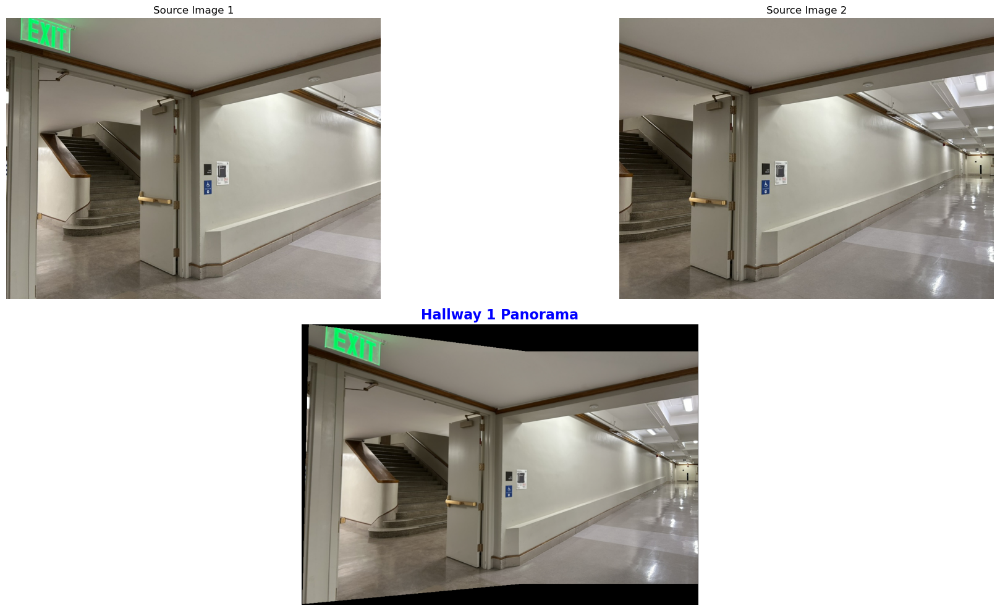

Stitching 3 images with image 1 as coordinate reference
Processing image 0...
Processing image 1...
Processing image 2...


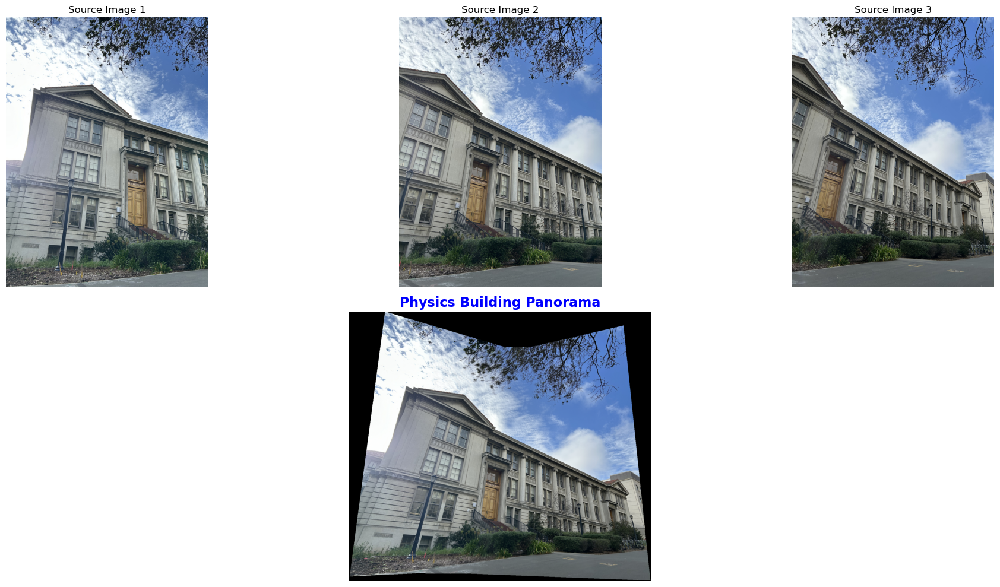

Stitching 2 images with image 1 as coordinate reference
Processing image 0...


In [ ]:
# 1. Hallway 1 Panorama
correspondences_hw1 = [(None, None, D12)]
panorama_hw1 = create_panorama(b1p_imgs, correspondences_hw1, reference_idx=1)
display_panorama(b1p_imgs, panorama_hw1, "Hallway 1 Panorama")
plt.imsave('hw1_panorama.jpg', panorama_hw1[:, :, :3])

# 2. Phy P
correspondences_phy = [(None, None, P12), (None, None, P23)]
panorama_phy = create_panorama(phy_imgs, correspondences_phy, reference_idx=1)
display_panorama(phy_imgs, panorama_phy, "Physics Building Panorama")
plt.imsave('phy_panorama.jpg', panorama_phy[:, :, :3])

# 3. Hallway 2
correspondences_sh = [(None, None, SH12)]
panorama_sh = create_panorama(a1p_imgs, correspondences_sh, reference_idx=1)
display_panorama(a1p_imgs, panorama_sh, "Hallway 2 Panorama")
plt.imsave('sh_panorama.jpg', panorama_sh[:, :, :3])